In [1]:
import pandas as pd
import numpy as np
import warnings
import seaborn as sns
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.metrics import classification_report, confusion_matrix

warnings.filterwarnings('ignore')

In [2]:
# Load the data
data = pd.read_csv("Crowd data for anomaly detection.csv")
data.head()

,timestamp,X,Y,Speed,Heading,AgentCount,Density,Acc,LevelOfCrowdness,label,label2,Severity_level
0,0:05:36,0.4225,19.1176,1.1432,89.1222,81,0.81,-0.0027,1,0,normal,0
1,0:05:37,0.3704,19.5130,1.1476,89.5976,83,0.83,-0.0027,1,0,normal,0
2,0:05:38,0.3999,19.8316,1.1466,89.4905,86,0.86,-0.0051,1,0,normal,0
3,0:05:39,0.3787,20.0386,1.1521,89.2123,88,0.88,-0.0009,1,0,normal,0
4,0:05:40,0.4031,20.4625,1.1499,89.2521,88,0.88,-0.0012,1,0,normal,0


In [3]:
# Convert the timestamp to a proper datetime format
data['timestamp'] = pd.to_datetime(data['timestamp'], format='%H:%M:%S')

# Extracting hour, minute, and second from the timestamp for 3D plotting
data['time_seconds'] = data['timestamp'].dt.hour * 3600 + data['timestamp'].dt.minute * 60 + data['timestamp'].dt.second


In [4]:
# Data Summary
data.describe()

,X,Y,Speed,Heading,AgentCount,Density,Acc,LevelOfCrowdness,label,Severity_level,time_seconds
count,24123.000000,24123.000000,24123.000000,24123.000000,24123.000000,24123.000000,24019.000000,24123.000000,24123.000000,24123.000000,24123.000000
mean,0.319789,19.989362,0.742941,90.314782,251.092277,2.510923,0.004203,2.337064,0.288977,0.509265,1946.060565
std,0.067545,1.205473,0.279331,4.803848,167.615884,1.676159,0.032528,1.456331,0.453297,0.857201,1013.881450
min,-1.205900,11.162700,0.124400,84.324100,1.000000,0.010000,-1.031300,1.000000,0.000000,0.000000,13.000000
25%,0.264500,19.575700,0.496700,88.475950,134.000000,1.340000,-0.001400,1.000000,0.000000,0.000000,1082.500000
50%,0.325400,20.288600,0.784300,89.170200,187.000000,1.870000,0.006300,2.000000,0.000000,0.000000,2002.000000
75%,0.356800,20.692900,1.005900,89.798100,336.000000,3.360000,0.013900,3.000000,1.000000,1.000000,2838.000000
max,1.966700,23.771700,1.567800,138.162100,990.000000,9.900000,0.455500,5.000000,1.000000,3.000000,3599.000000


In [5]:
print("Before : " )
print(data.isna().sum())
data = data.fillna(method='ffill')
print("\nAfter : ")
print(data.isna().sum())

Before : 
timestamp             0
X                     0
Y                     0
Speed                 0
Heading               0
AgentCount            0
Density               0
Acc                 104
LevelOfCrowdness      0
label                 0
label2                0
Severity_level        0
time_seconds          0
dtype: int64

After : 
timestamp           0
X                   0
Y                   0
Speed               0
Heading             0
AgentCount          0
Density             0
Acc                 0
LevelOfCrowdness    0
label               0
label2              0
Severity_level      0
time_seconds        0
dtype: int64


plt.figure(figsize=(24, 18))
sns.pairplot(data, hue="label2")
plt.show()

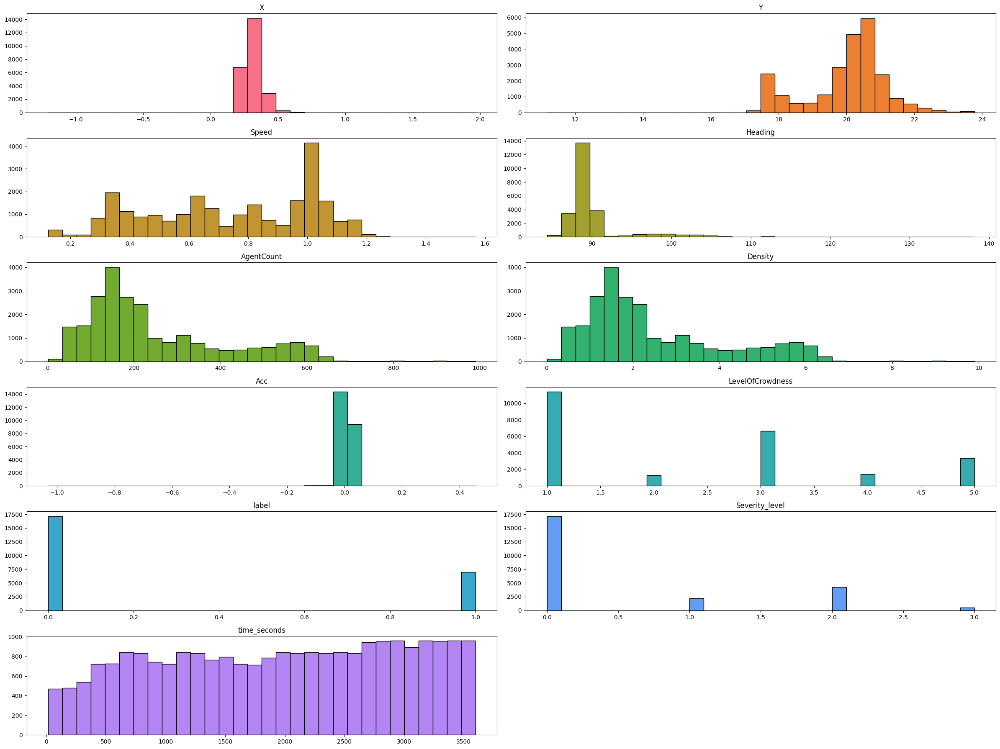

In [6]:
# Plot histograms for numerical columns
plt.figure(figsize=(24, 18))
colors = sns.color_palette("husl", len(data.columns))
num_cols = len(data.select_dtypes(include=['float64', 'int64']).columns)
num_rows = (num_cols + 1) // 2

for i, column in enumerate(data.select_dtypes(include=['float64', 'int64']).columns):
    plt.subplot(num_rows, 2, i+1)
    plt.hist(data[column], bins=30, color=colors[i], edgecolor='black')
    plt.title(column)

plt.tight_layout()
plt.show()

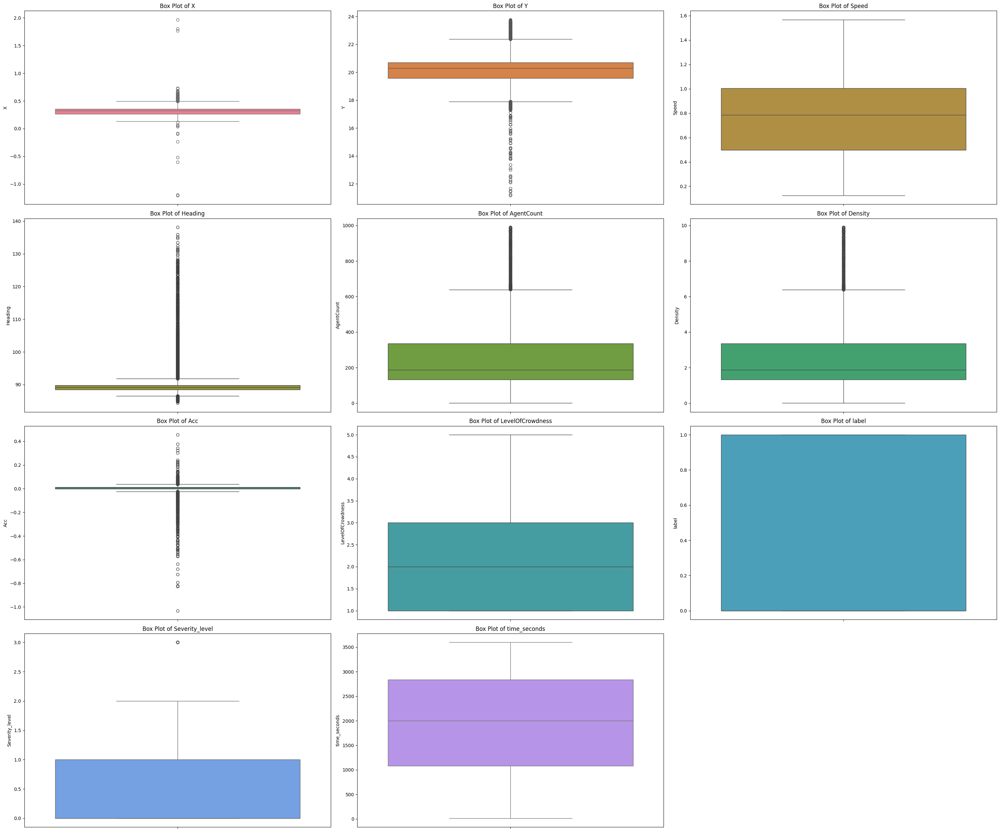

In [7]:
# Plot box plots for numerical columns
plt.figure(figsize=(30, 25))
colors = sns.color_palette("husl", len(data.columns))
num_cols = len(data.select_dtypes(include=['float64', 'int64']).columns)
num_rows = (num_cols + 2) // 3

for i, (column, color) in enumerate(zip(data.select_dtypes(include=['float64', 'int64']).columns, colors), 1):
    plt.subplot(num_rows, 3, i)
    sns.boxplot(y=data[column], color=color)
    plt.title(f'Box Plot of {column}')

plt.tight_layout()
plt.show()

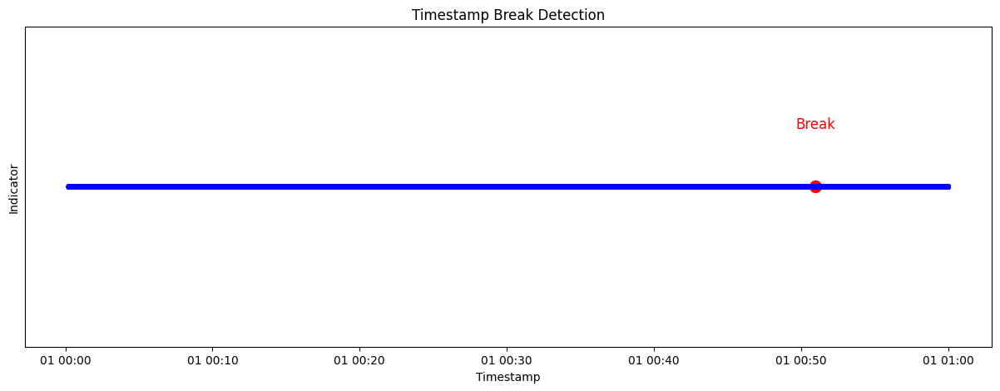

In [8]:
# Calculate time differences between consecutive timestamps
data['time_diff'] = data['timestamp'].diff()

# Define a threshold to identify breaks (e.g., 5 minutes)
threshold = pd.Timedelta(minutes=5)
data['is_break'] = data['time_diff'] > threshold

# Plot with lines connecting the points and highlighting the breaks
plt.figure(figsize=(15, 5))

# Line plot of timestamps
plt.plot(data['timestamp'], [1]*len(data), color='blue', marker='o', linestyle='-', markersize=4)

# Highlight breaks
breaks = data[data['is_break']]
plt.scatter(breaks['timestamp'], [1]*len(breaks), color='red', marker='o', s=100)  # Increase size of break points

# Add text annotations for breaks
for idx, row in breaks.iterrows():
    plt.text(row['timestamp'], 1.02, 'Break', color='red', ha='center', fontsize=12)

# Customize plot
plt.xlabel('Timestamp')
plt.ylabel('Indicator')
plt.title('Timestamp Break Detection')
plt.yticks([])  # Remove y-axis ticks since they are not meaningful here

plt.show()

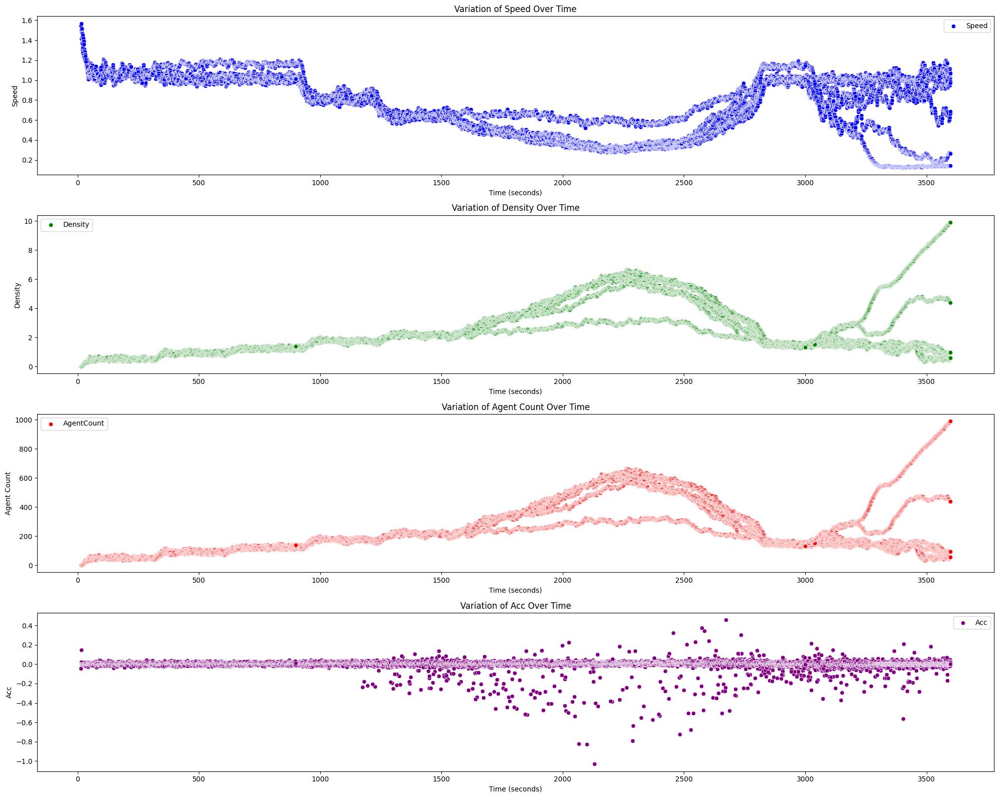

In [9]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(20, 16))

plt.subplot(4, 1, 1)
sns.scatterplot(x=data['time_seconds'], y=data['Speed'], label='Speed', color='blue')
plt.xlabel('Time (seconds)')
plt.ylabel('Speed')
plt.title('Variation of Speed Over Time')
plt.legend()

plt.subplot(4, 1, 2)
sns.scatterplot(x=data['time_seconds'], y=data['Density'], label='Density', color='green')
plt.xlabel('Time (seconds)')
plt.ylabel('Density')
plt.title('Variation of Density Over Time')
plt.legend()

plt.subplot(4, 1, 3)
sns.scatterplot(x=data['time_seconds'], y=data['AgentCount'], label='AgentCount', color='red')
plt.xlabel('Time (seconds)')
plt.ylabel('Agent Count')
plt.title('Variation of Agent Count Over Time')
plt.legend()

plt.subplot(4, 1, 4)
sns.scatterplot(x=data['time_seconds'], y=data['Acc'], label='Acc', color='purple')
plt.xlabel('Time (seconds)')
plt.ylabel('Acc')
plt.title('Variation of Acc Over Time')
plt.legend()


plt.tight_layout()
plt.show()


In [10]:
import plotly.graph_objects as go

# Calculate values
values = data['label'].value_counts(normalize=True)

# Define colors and labels
colors = ['gold', 'mediumturquoise']
labels = ['Normal', 'Anomaly']

# Create the Pie chart
fig = go.Figure(data=[go.Pie(labels=labels, values=values, hole=.3)])

# Update trace and layout
fig.update_traces(hoverinfo='label+percent', textinfo='percent', textfont_size=20,
                  marker=dict(colors=colors, line=dict(color='white', width=0.1)))
fig.update_layout(
    title_text="Anomaly Detection in crowd dataset",
    title_font_color="black",
    legend_title_font_color="yellow",
    paper_bgcolor="white",
    plot_bgcolor='white',
    font_color="black",
)

# Show the plot
fig.show()


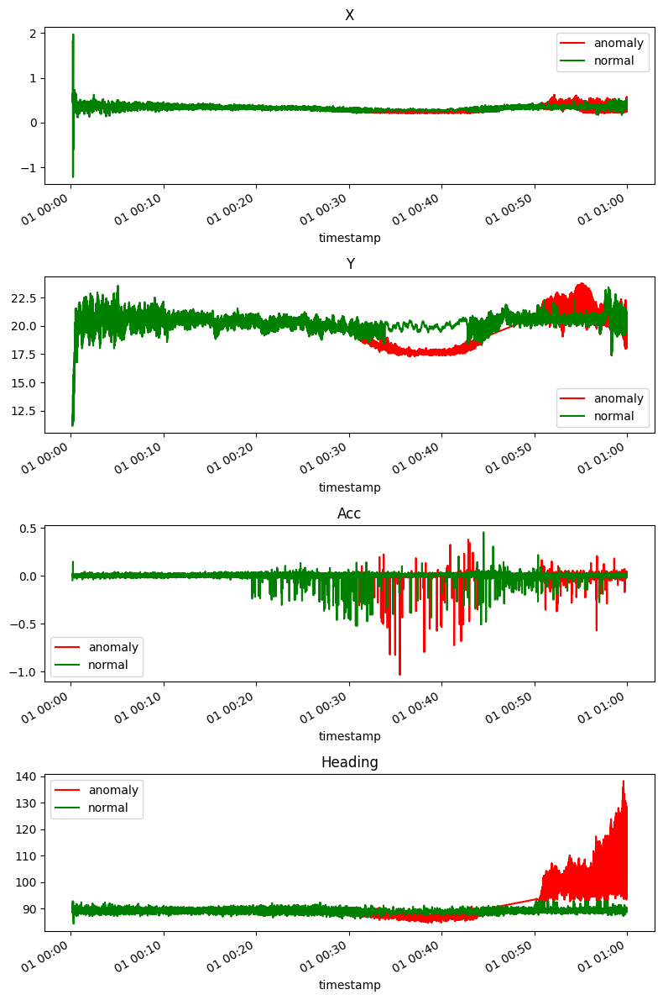

In [11]:
# Plot variables by 'label2'
var_columns = ['X', 'Y', 'Acc','Heading']
fig, axes = plt.subplots(len(var_columns), 1, figsize=(8, 3 * len(var_columns)))
grouped = data.groupby('label2')
colors = {'normal': 'green', 'anomaly': 'red'}

for ax, column in zip(axes.flatten(), var_columns):
    for key, group in grouped:
        group.plot(ax=ax, x='timestamp', y=column, label=key, color=colors.get(key, 'blue'))
    ax.set_title(column)

plt.tight_layout()
plt.show()

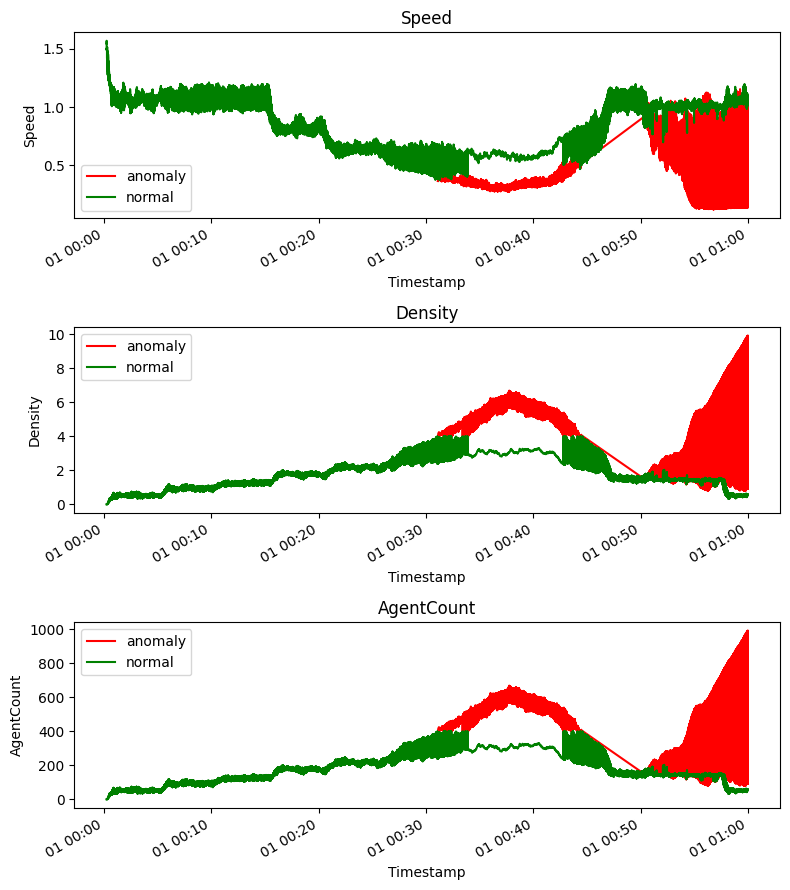

In [12]:
var_columns = ['Speed', 'Density', 'AgentCount']

fig, axes = plt.subplots(len(var_columns), 1, figsize=(8, 3 * len(var_columns)))

# Example grouped data (replace with your actual grouped data)
grouped = data.groupby('label2')
colors = {'normal': 'green', 'anomaly': 'red'}  # Define colors as a dictionary

for ax, column in zip(axes.flatten(), var_columns):
    for key, group in grouped:
        group.plot(ax=ax, x='timestamp', y=column, label=key, color=colors.get(key, 'blue'))
    ax.set_title(column)
    ax.set_xlabel('Timestamp')
    ax.set_ylabel(column)

plt.tight_layout()
plt.show()

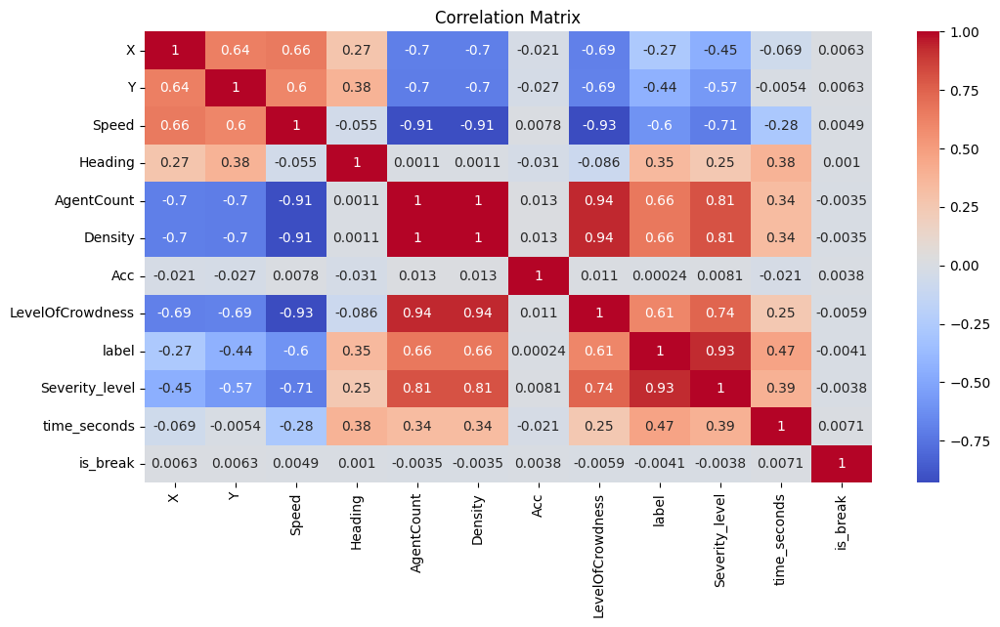

In [13]:
# Plot correlation matrix
plt.figure(figsize=(12, 6))
corr = data.corr(numeric_only=True)
sns.heatmap(corr, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

In [14]:
#  Convert the timestamp to a proper datetime format if needed
data['timestamp'] = pd.to_datetime(data['timestamp'], format='%H:%M:%S')

# Data Preprocessing

In [15]:
data = data.fillna(method='ffill')


In [16]:
# Drop columns "is_break" and "time_diff"
data = data.drop(columns=["is_break", "time_diff","label"])

# Calculate correlation matrix
corr_matrix = data.corr()

# Identify highly correlated pairs (threshold set at 0.9)
threshold = 0.9
high_corr_pairs = [(i, j) for i in corr_matrix.columns for j in corr_matrix.columns if i != j and abs(corr_matrix.loc[i, j]) > threshold]

# Print highly correlated pairs
print("Highly correlated pairs:")
for pair in high_corr_pairs:
    print(f"{pair[0]} and {pair[1]}: {corr_matrix.loc[pair[0], pair[1]]}")

# Remove highly correlated fields (keep only one from each pair)
columns_to_remove = set()
for pair in high_corr_pairs:
    if pair[0] not in columns_to_remove and pair[1] not in columns_to_remove:
        columns_to_remove.add(pair[1])  # Arbitrarily remove the second column in the pair

print(columns_to_remove)
# Remove the columns
data = data.drop(columns=[ 'AgentCount', 'LevelOfCrowdness'])

# Display the reduced dataset
print("Reduced Data Columns: ", data.columns)
data.head()

Highly correlated pairs:
Speed and AgentCount: -0.9149229022262532
Speed and Density: -0.914922902226254
Speed and LevelOfCrowdness: -0.929420047951036
AgentCount and Speed: -0.9149229022262532
AgentCount and Density: 0.9999999999999996
AgentCount and LevelOfCrowdness: 0.935304381630287
Density and Speed: -0.914922902226254
Density and AgentCount: 0.9999999999999996
Density and LevelOfCrowdness: 0.9353043816302847
LevelOfCrowdness and Speed: -0.929420047951036
LevelOfCrowdness and AgentCount: 0.935304381630287
LevelOfCrowdness and Density: 0.9353043816302847
{'LevelOfCrowdness', 'AgentCount', 'Density'}
Reduced Data Columns:  Index(['timestamp', 'X', 'Y', 'Speed', 'Heading', 'Density', 'Acc', 'label2',
       'Severity_level', 'time_seconds'],
      dtype='object')


,timestamp,X,Y,Speed,Heading,Density,Acc,label2,Severity_level,time_seconds
0,1900-01-01 00:05:36,0.4225,19.1176,1.1432,89.1222,0.81,-0.0027,normal,0,336
1,1900-01-01 00:05:37,0.3704,19.5130,1.1476,89.5976,0.83,-0.0027,normal,0,337
2,1900-01-01 00:05:38,0.3999,19.8316,1.1466,89.4905,0.86,-0.0051,normal,0,338
3,1900-01-01 00:05:39,0.3787,20.0386,1.1521,89.2123,0.88,-0.0009,normal,0,339
4,1900-01-01 00:05:40,0.4031,20.4625,1.1499,89.2521,0.88,-0.0012,normal,0,340


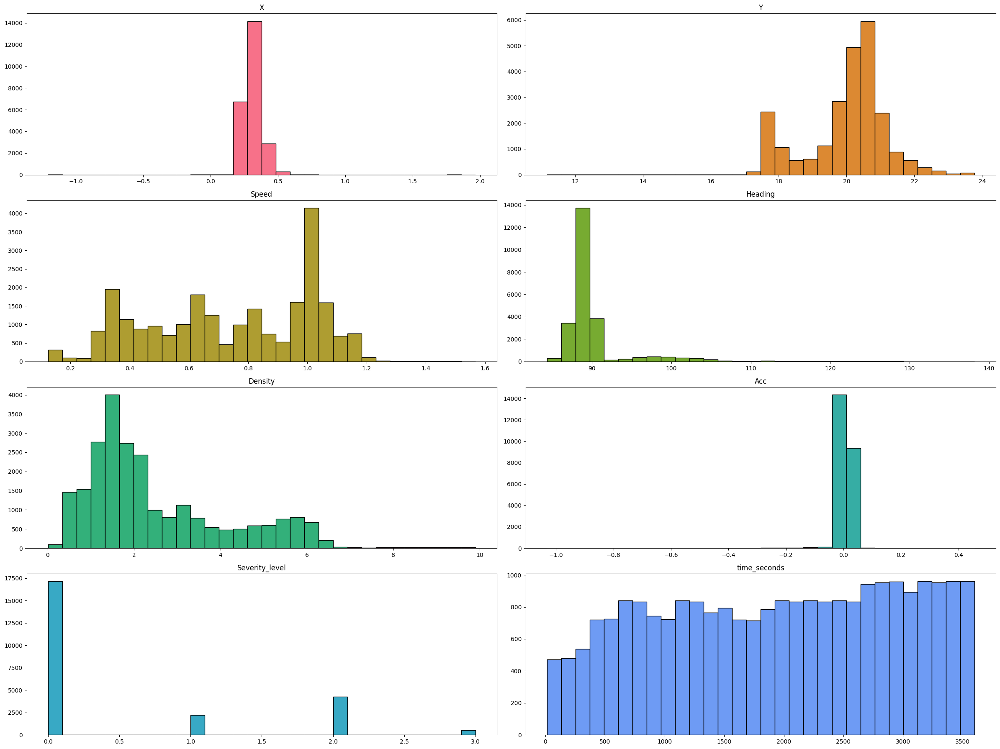

In [17]:
# Plot histograms for numerical columns
plt.figure(figsize=(24, 18))
colors = sns.color_palette("husl", len(data.columns))
num_cols = len(data.select_dtypes(include=['float64', 'int64']).columns)
num_rows = (num_cols + 1) // 2

for i, column in enumerate(data.select_dtypes(include=['float64', 'int64']).columns):
    plt.subplot(num_rows, 2, i+1)
    plt.hist(data[column], bins=30, color=colors[i], edgecolor='black')
    plt.title(column)

plt.tight_layout()
plt.show()

# IQR methods for Outliers

In [18]:
numerical_cols = ['X', 'Y', 'Speed', 'Heading', 'Acc','Density','time_seconds']

In [19]:
data1=data
data2=data
# Remove outliers using IQR
Q1 = data[numerical_cols].quantile(0.25)
Q3 = data[numerical_cols].quantile(0.75)
IQR = Q3 - Q1

bounds = []
outliers = pd.DataFrame()

for col in numerical_cols:
    lower_bound = Q1[col] - 1.5 * IQR[col]
    upper_bound = Q3[col] + 1.5 * IQR[col]
    col_outliers = ((data[col] < lower_bound) | (data[col] > upper_bound))
    outliers_count = col_outliers.sum()
    outliers[col] = col_outliers
    bounds.append({
        'Column': col,
        'Lower Bound': lower_bound,
        'Upper Bound': upper_bound,
        'Outlier Count': outliers_count
    })

# Convert the list of dictionaries to a DataFrame for better visualization
bounds_df = pd.DataFrame(bounds)
bounds_df

,Column,Lower Bound,Upper Bound,Outlier Count
0,X,0.126050,0.495250,280
1,Y,17.899900,22.368700,3004
2,Speed,-0.267100,1.769700,0
3,Heading,86.492725,91.781325,3461
4,Acc,-0.024350,0.036850,861
5,Density,-1.690000,6.390000,286
6,time_seconds,-1550.750000,5471.250000,0


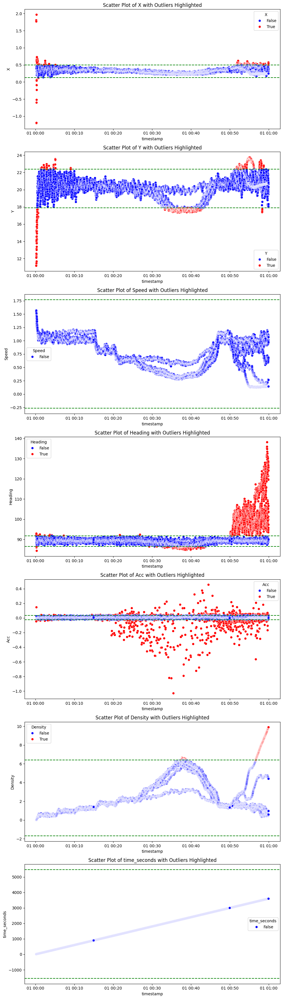

In [20]:
# Plotting
fig, axes = plt.subplots(len(numerical_cols), 1, figsize=(10, 5 * len(numerical_cols)))

for i, col in enumerate(numerical_cols):
    sns.scatterplot(
        x='timestamp', y=col, 
        data=data, 
        hue=outliers[col], 
        palette={False: 'blue', True: 'red'}, 
        ax=axes[i]
    )
    axes[i].set_title(f'Scatter Plot of {col} with Outliers Highlighted')
    axes[i].axhline(bounds_df[bounds_df['Column'] == col]['Lower Bound'].values[0], color='green', linestyle='--')
    axes[i].axhline(bounds_df[bounds_df['Column'] == col]['Upper Bound'].values[0], color='green', linestyle='--')

plt.tight_layout()
plt.show()

# z score Method

In [21]:
# Exclude datetime columns from the dataset
df_numeric = data.select_dtypes(include=[np.number])

# Calculate Z-scores for each numeric column
z_scores = (df_numeric - df_numeric.mean()) / df_numeric.std()

# Identify outliers: rows where any column has a Z-score greater than 3 or less than -3
outliers = (z_scores > 2.9) | (z_scores < -2.9)

# Create a new column in the original dataframe to indicate outliers
data['Outlier'] = outliers.any(axis=1)

# Print the number of outliers in the entire dataset
num_outliers = data['Outlier'].sum()
print("Number of overall outliers in the dataset:", num_outliers)

# Display the dataframe with the new 'Outlier' column
data.head()

Number of overall outliers in the dataset: 1272


,timestamp,X,Y,Speed,Heading,Density,Acc,label2,Severity_level,time_seconds,Outlier
0,1900-01-01 00:05:36,0.4225,19.1176,1.1432,89.1222,0.81,-0.0027,normal,0,336,False
1,1900-01-01 00:05:37,0.3704,19.5130,1.1476,89.5976,0.83,-0.0027,normal,0,337,False
2,1900-01-01 00:05:38,0.3999,19.8316,1.1466,89.4905,0.86,-0.0051,normal,0,338,False
3,1900-01-01 00:05:39,0.3787,20.0386,1.1521,89.2123,0.88,-0.0009,normal,0,339,False
4,1900-01-01 00:05:40,0.4031,20.4625,1.1499,89.2521,0.88,-0.0012,normal,0,340,False


In [22]:
# Function to calculate Z-score
def calculate_z_scores(df, cols):
    z_scores = pd.DataFrame()
    for col in cols:
        mean = df[col].mean()
        std = df[col].std()
        z_scores[col] = (df[col] - mean) / std
    return z_scores

# Calculate Z-scores for each numerical column
z_scores = calculate_z_scores(data, numerical_cols)

# Set the threshold for identifying potential anomalies
threshold = 2.9

# Identify outliers based on Z-score threshold
outliers = z_scores.abs() > threshold

# Calculate the number of outliers for each column and the upper and lower bounds
bounds = []
for col in numerical_cols:
    mean = data[col].mean()
    std = data[col].std()
    lower_bound = mean - threshold * std
    upper_bound = mean + threshold * std
    outliers_count = outliers[col].sum()
    bounds.append({
        'Column': col,
        'Lower Bound': lower_bound,
        'Upper Bound': upper_bound,
        'Outlier Count': outliers_count
    })

# Convert the list of dictionaries to a DataFrame for better visualization
bounds_df = pd.DataFrame(bounds)

# Print the DataFrame
bounds_df



,Column,Lower Bound,Upper Bound,Outlier Count
0,X,0.123909,0.515668,161
1,Y,16.493490,23.485234,90
2,Speed,-0.067119,1.553000,1
3,Heading,76.383622,104.245943,571
4,Acc,-0.090028,0.098382,259
5,Density,-2.349938,7.371783,148
6,time_seconds,-994.195641,4886.316771,0


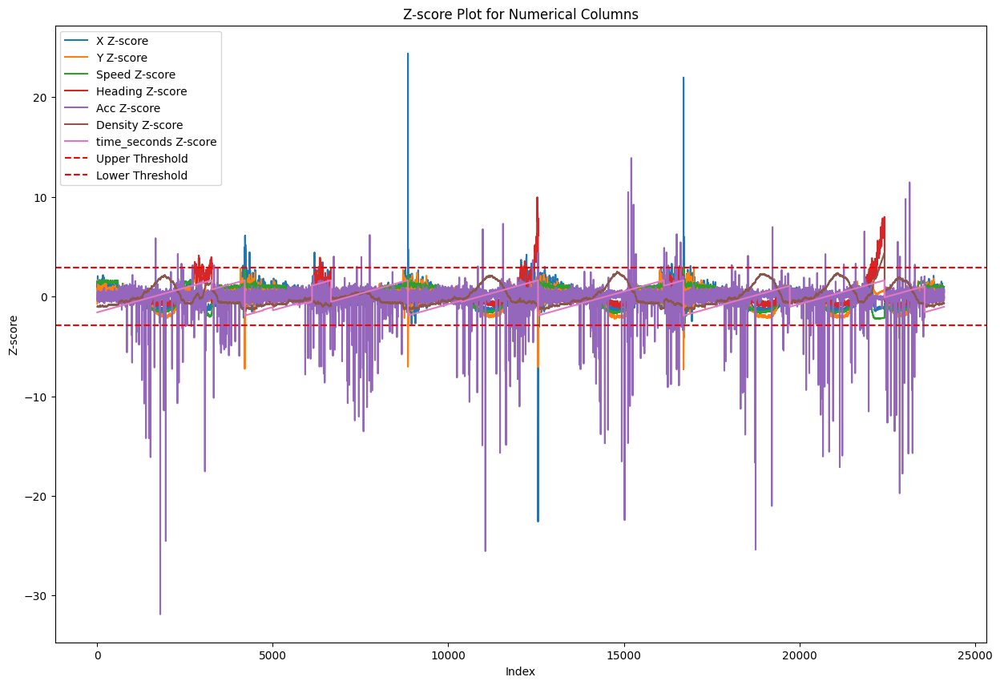

In [23]:
# Plot the Z-score graph
plt.figure(figsize=(15, 10))
for col in numerical_cols:
    plt.plot(z_scores[col], label=f'{col} Z-score')

plt.axhline(y=threshold, color='r', linestyle='--', label='Upper Threshold')
plt.axhline(y=-threshold, color='r', linestyle='--', label='Lower Threshold')
plt.title('Z-score Plot for Numerical Columns')
plt.xlabel('Index')
plt.ylabel('Z-score')
plt.legend()
plt.show()

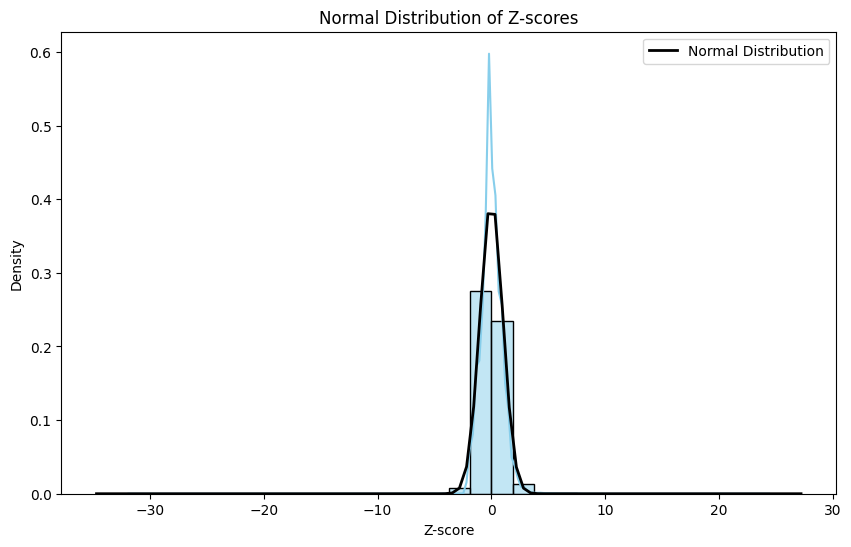

In [24]:
import numpy as np
import seaborn as sns
import scipy.stats as stats

# Function to calculate Z-score
def calculate_z_scores(df, cols):
    z_scores = pd.DataFrame()
    for col in cols:
        mean = df[col].mean()
        std = df[col].std()
        z_scores[col] = (df[col] - mean) / std
    return z_scores

# Assume data and numerical_cols are already defined
# data = your DataFrame
# numerical_cols = list of numerical column names

# Calculate Z-scores for each numerical column
z_scores = calculate_z_scores(data, numerical_cols)

# Flatten the Z-scores into a single array for the histogram
all_z_scores = z_scores.values.flatten()

# Plot the histogram of Z-scores
plt.figure(figsize=(10, 6))
sns.histplot(all_z_scores, kde=True, stat="density", bins=30, color='skyblue')

# Plot the normal distribution curve
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 100)
p = stats.norm.pdf(x, 0, 1)  # mean=0, std=1 for standard normal distribution
plt.plot(x, p, 'k', linewidth=2, label='Normal Distribution')

plt.title('Normal Distribution of Z-scores')
plt.xlabel('Z-score')
plt.ylabel('Density')
plt.legend()
plt.show()


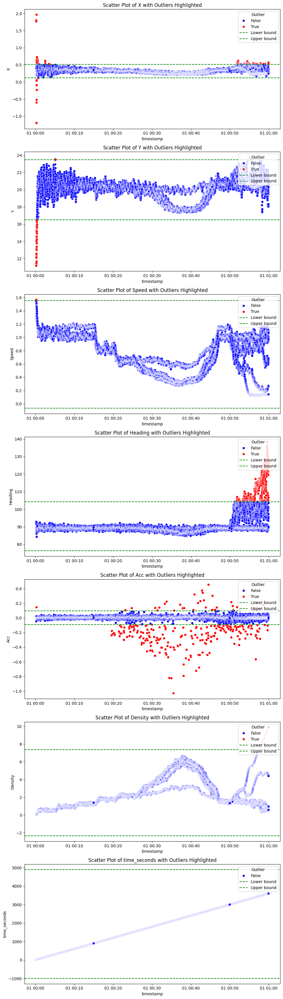

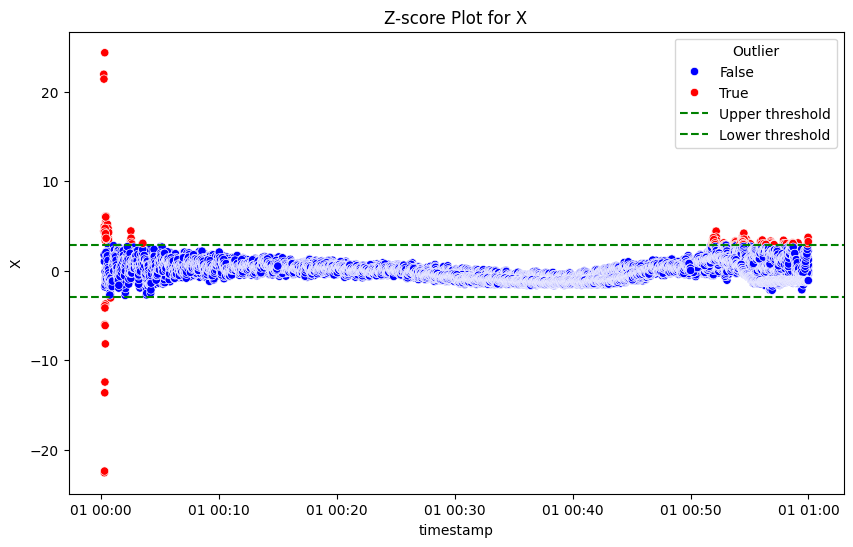

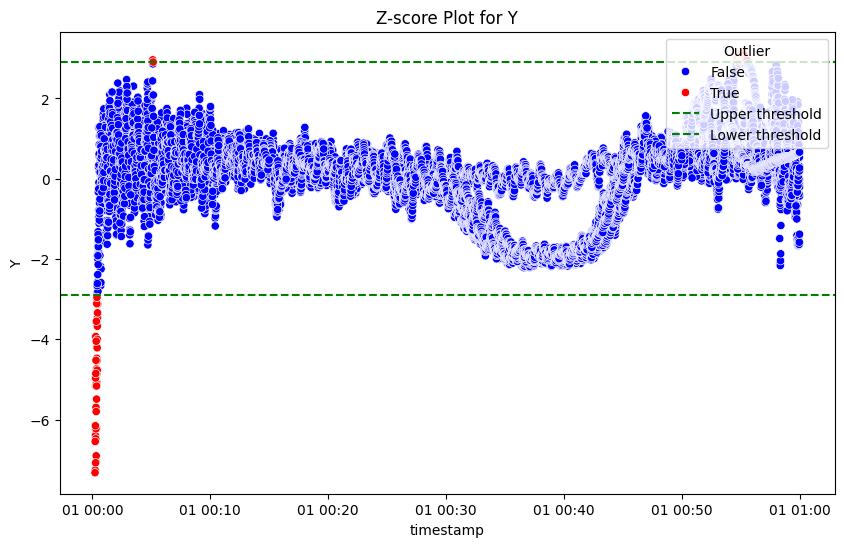

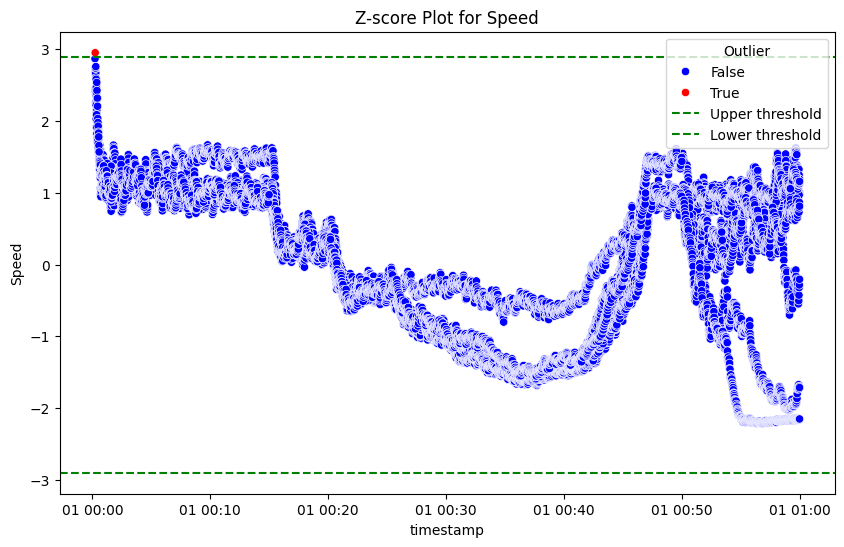

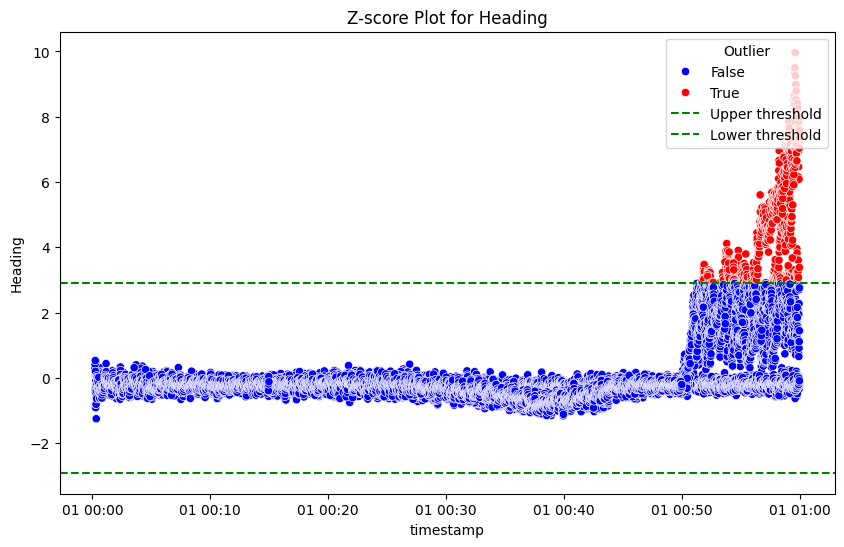

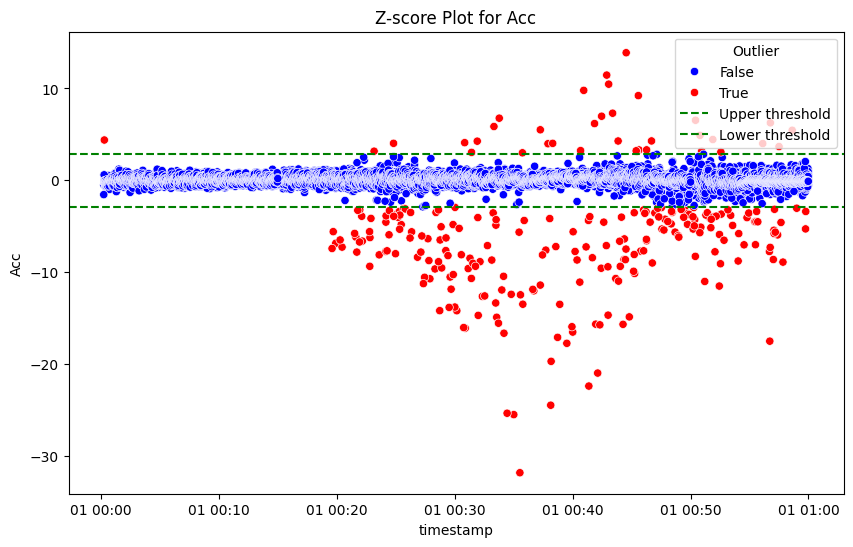

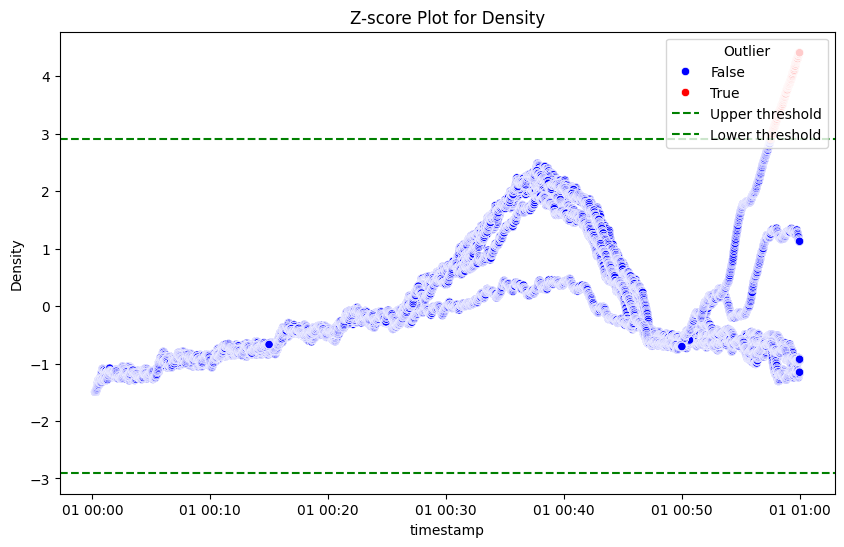

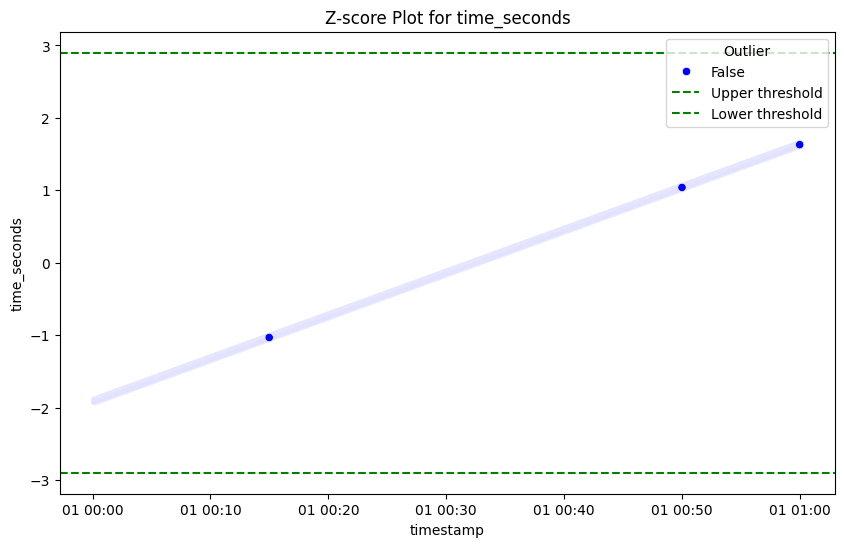

In [25]:
# Plotting
fig, axes = plt.subplots(len(numerical_cols), 1, figsize=(10, 5 * len(numerical_cols)))

for i, col in enumerate(numerical_cols):
    sns.scatterplot(
        x='timestamp', y=col, 
        data=data, 
        hue=outliers[col], 
        palette={False: 'blue', True: 'red'}, 
        ax=axes[i]
    )
    axes[i].set_title(f'Scatter Plot of {col} with Outliers Highlighted')
    lower_bound = bounds_df[bounds_df['Column'] == col]['Lower Bound'].values[0]
    upper_bound = bounds_df[bounds_df['Column'] == col]['Upper Bound'].values[0]
    axes[i].axhline(lower_bound, color='green', linestyle='--', label='Lower bound')
    axes[i].axhline(upper_bound, color='green', linestyle='--', label='Upper bound')
    axes[i].legend(title='Outlier', loc='upper right')

plt.tight_layout()
plt.show()

# Plot Z-scores for each column
for col in numerical_cols:
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x='timestamp', y=z_scores[col], data=data, hue=outliers[col], palette={False: 'blue', True: 'red'})
    plt.axhline(y=threshold, color='green', linestyle='--', label='Upper threshold')
    plt.axhline(y=-threshold, color='green', linestyle='--', label='Lower threshold')
    plt.title(f'Z-score Plot for {col}')
    plt.legend(title='Outlier', loc='upper right')
    plt.show()

In [26]:
# Standardize numerical columns
numerical_cols = ['X', 'Y', 'Speed', 'Heading', 'Acc','Density','time_seconds']
scaler = StandardScaler()
data[numerical_cols] = scaler.fit_transform(data[numerical_cols])


In [27]:
# Encode 'label2' column
categorical_cols = ['label2','Outlier']
label_encoder = LabelEncoder()
data['label2_encoded'] = label_encoder.fit_transform(data['label2'])
data['outlier_encoded'] = label_encoder.fit_transform(data['Outlier'])

In [28]:
data['outlier_encoded'].value_counts()

0    22851
1     1272
Name: outlier_encoded, dtype: int64

# Decision Tree => Z Score

### Removing the outliers based on the Z-Score method

In [29]:
# Create a boolean mask for rows with any outliers
outliers_data = outliers.any(axis=1)

data_Z = data.copy()

print(data_Z.shape)

# Filter the dataset to exclude rows with any outliers
data_Z = data_Z[~outliers_data]

print(data_Z.shape)

# Display the first few rows of the filtered dataset
data_Z.head()

(24123, 13)
(23093, 13)


,timestamp,X,Y,Speed,Heading,Density,Acc,label2,Severity_level,time_seconds,Outlier,label2_encoded,outlier_encoded
0,1900-01-01 00:05:36,1.520675,-0.723185,1.432952,-0.248261,-1.014795,-0.211707,normal,0,-1.588050,False,1,0
1,1900-01-01 00:05:37,0.749318,-0.395174,1.448705,-0.149296,-1.002863,-0.211707,normal,0,-1.587063,False,1,0
2,1900-01-01 00:05:38,1.186075,-0.130874,1.445125,-0.171591,-0.984965,-0.285589,normal,0,-1.586077,False,1,0
3,1900-01-01 00:05:39,0.872202,0.040846,1.464815,-0.229505,-0.973032,-0.156295,normal,0,-1.585091,False,1,0
4,1900-01-01 00:05:40,1.233452,0.392500,1.456939,-0.221219,-0.973032,-0.165530,normal,0,-1.584104,False,1,0


In [30]:
# Define features and target
X = data_Z.drop(columns=['timestamp',  'label2', 'Outlier','Severity_level','outlier_encoded'])
y = data_Z['outlier_encoded']
X.head()

,X,Y,Speed,Heading,Density,Acc,time_seconds,label2_encoded
0,1.520675,-0.723185,1.432952,-0.248261,-1.014795,-0.211707,-1.588050,1
1,0.749318,-0.395174,1.448705,-0.149296,-1.002863,-0.211707,-1.587063,1
2,1.186075,-0.130874,1.445125,-0.171591,-0.984965,-0.285589,-1.586077,1
3,0.872202,0.040846,1.464815,-0.229505,-0.973032,-0.156295,-1.585091,1
4,1.233452,0.392500,1.456939,-0.221219,-0.973032,-0.165530,-1.584104,1


In [31]:
# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [32]:
# Initialize the classifier
clf_gini = DecisionTreeClassifier(criterion="gini", random_state=100, max_depth=3)

# Perform training
clf_gini.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=3, random_state=100)

In [33]:
# Predict and evaluate the model
y_pred = clf_gini.predict(X_test)

# Output the predictions
print(y_pred)

[0 0 0 ... 0 0 0]


In [34]:
from sklearn.metrics import accuracy_score

print("Training Accuracy : ",clf_gini.score(X_train,y_train))
print("Testing Accuracy : ",clf_gini.score(X_test,y_test))
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy}')

Training Accuracy :  0.9995669589693623
Testing Accuracy :  0.9995670058454211
Accuracy: 0.9995670058454211


confusion_matrix :


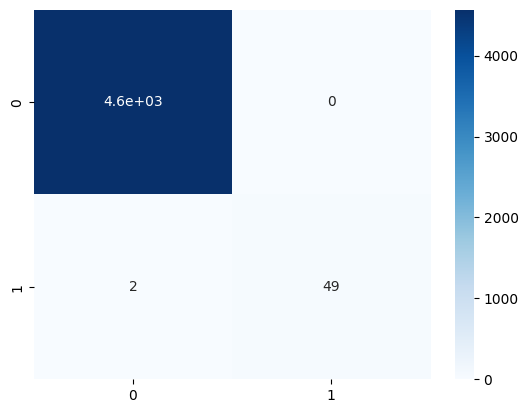


Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      4568
           1       1.00      0.96      0.98        51

    accuracy                           1.00      4619
   macro avg       1.00      0.98      0.99      4619
weighted avg       1.00      1.00      1.00      4619



In [35]:
cm = confusion_matrix(y_test,y_pred)
print("confusion_matrix :")
sns.heatmap(cm,annot=True,cmap=plt.cm.Blues)
plt.show()
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

In [36]:
# Feature importance
feature_importances = pd.DataFrame(clf_gini.feature_importances_, index=X.columns, columns=['importance']).sort_values('importance', ascending=False)
print("\nFeature Importances:")
print(feature_importances)


Feature Importances:
                importance
Speed             0.946152
time_seconds      0.053848
X                 0.000000
Y                 0.000000
Heading           0.000000
Density           0.000000
Acc               0.000000
label2_encoded    0.000000


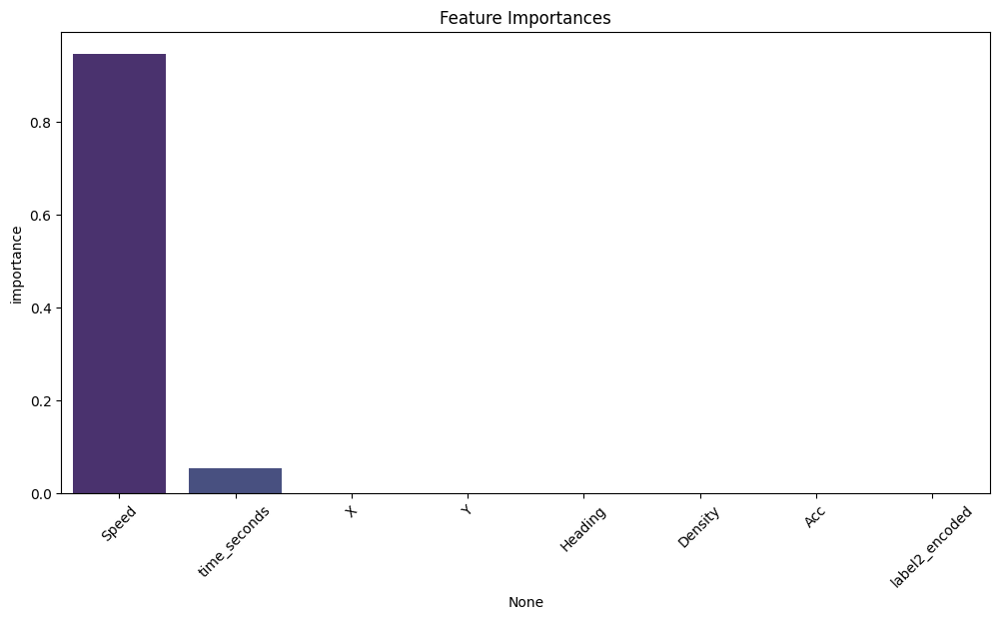

In [37]:
# Plot feature importances
plt.figure(figsize=(12, 6))
sns.barplot(x=feature_importances.index, y=feature_importances['importance'],palette='viridis')
plt.title('Feature Importances')
plt.xticks(rotation=45)
plt.show()

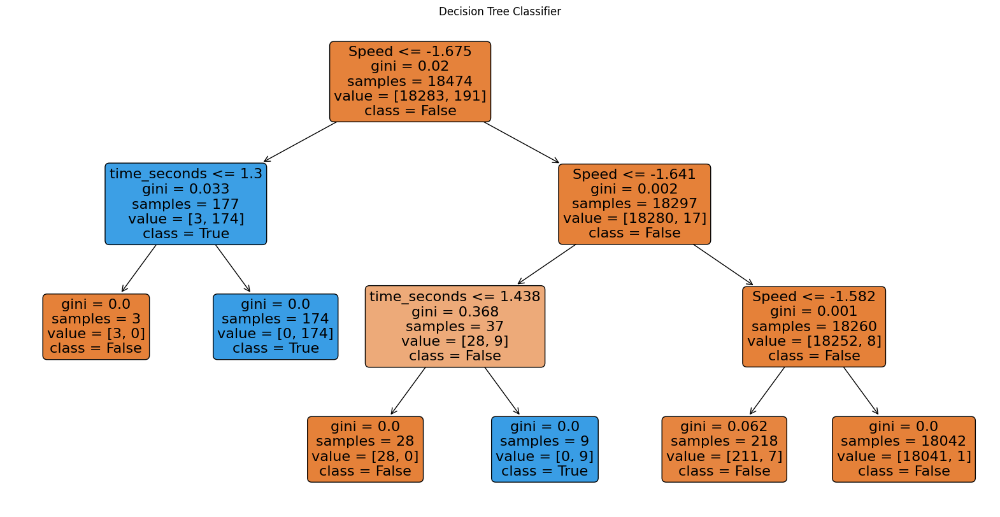

In [38]:
# Plot the Decision Tree
plt.figure(figsize=(20, 10))
from sklearn import tree

# Convert class names to strings
class_names = label_encoder.classes_.astype(str)

tree.plot_tree(clf_gini, feature_names=X.columns, class_names=class_names, filled=True, rounded=True)
plt.title('Decision Tree Classifier')
plt.show()

# KNN Method

In [39]:
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier()
knn.fit(X_train, y_train)    
y_pred = knn.predict(X_test)


In [40]:
print("Training Accuracy : ",knn.score(X_train,y_train))
print("Testing Accuracy : ",knn.score(X_test,y_test))
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy}')


Training Accuracy :  0.9999458698711703
Testing Accuracy :  0.9995670058454211
Accuracy: 0.9995670058454211


confusion_matrix :


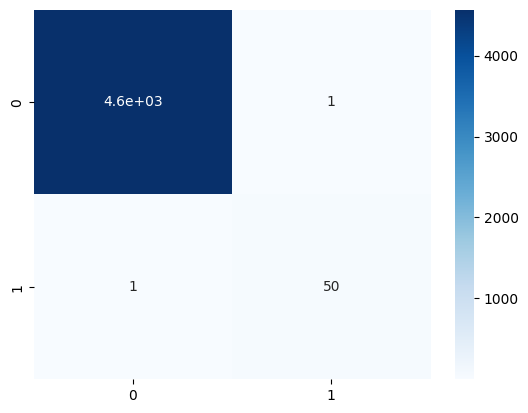


Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      4568
           1       0.98      0.98      0.98        51

    accuracy                           1.00      4619
   macro avg       0.99      0.99      0.99      4619
weighted avg       1.00      1.00      1.00      4619



In [41]:
cm = confusion_matrix(y_test,y_pred)
print("confusion_matrix :")
sns.heatmap(cm,annot=True,cmap=plt.cm.Blues)
plt.show()
print("\nClassification Report:")
print(classification_report(y_test, y_pred))


Number of outliers: 1155


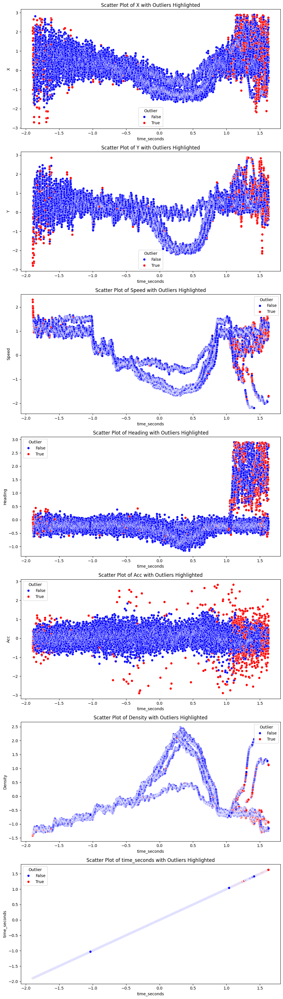

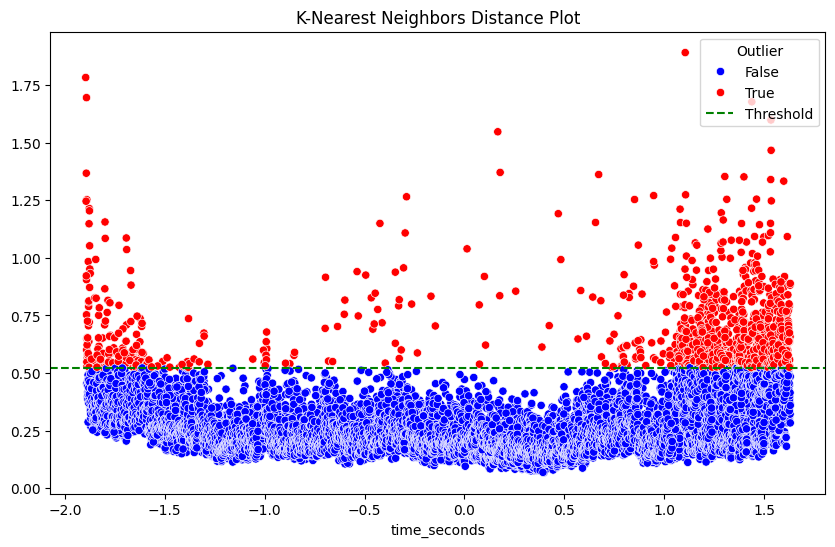

In [42]:
# Calculate the distances to the k-th nearest neighbor
distances, indices = knn.kneighbors(X)

k=5

# Extract the k-th nearest neighbor distances
k_distances = distances[:, k-1]

# Set the threshold for outliers
threshold = np.percentile(k_distances, 95)

# Identify outliers based on the threshold
outliers_KNN = k_distances > threshold

# Add the outlier information to the DataFrame
data_KNN = X.copy()
data_KNN['Outlier'] = outliers_KNN

# Print the number of outliers
outlier_count = outliers_KNN.sum()
print(f'Number of outliers: {outlier_count}')

# Plotting
fig, axes = plt.subplots(len(numerical_cols), 1, figsize=(10, 5 * len(numerical_cols)))

for i, col in enumerate(numerical_cols):
    sns.scatterplot(
        x='time_seconds', y=col, 
        data=data_KNN, 
        hue='Outlier', 
        palette={False: 'blue', True: 'red'}, 
        ax=axes[i]
    )
    axes[i].set_title(f'Scatter Plot of {col} with Outliers Highlighted')

plt.tight_layout()
plt.show()

# Plot KNN distances for each point
plt.figure(figsize=(10, 6))
sns.scatterplot(x=data_KNN['time_seconds'], y=k_distances, hue=outliers_KNN, palette={False: 'blue', True: 'red'})
plt.axhline(y=threshold, color='green', linestyle='--', label='Threshold')
plt.title('K-Nearest Neighbors Distance Plot')
plt.legend(title='Outlier', loc='upper right')
plt.show()



# Isolation Forest , LOF and SVM

In [43]:
data.head()

,timestamp,X,Y,Speed,Heading,Density,Acc,label2,Severity_level,time_seconds,Outlier,label2_encoded,outlier_encoded
0,1900-01-01 00:05:36,1.520675,-0.723185,1.432952,-0.248261,-1.014795,-0.211707,normal,0,-1.588050,False,1,0
1,1900-01-01 00:05:37,0.749318,-0.395174,1.448705,-0.149296,-1.002863,-0.211707,normal,0,-1.587063,False,1,0
2,1900-01-01 00:05:38,1.186075,-0.130874,1.445125,-0.171591,-0.984965,-0.285589,normal,0,-1.586077,False,1,0
3,1900-01-01 00:05:39,0.872202,0.040846,1.464815,-0.229505,-0.973032,-0.156295,normal,0,-1.585091,False,1,0
4,1900-01-01 00:05:40,1.233452,0.392500,1.456939,-0.221219,-0.973032,-0.165530,normal,0,-1.584104,False,1,0


In [44]:
normal = data[data['outlier_encoded']==0]

outliers = data[data['outlier_encoded']==1]

outlier_fraction = len(outliers)/float(len(normal))
print(outlier_fraction)

print("Normal Cases : {}".format(len(normal)))

print("Outliers Cases : {}".format(len(outliers))) 

0.05566495995798871
Normal Cases : 22851
Outliers Cases : 1272


In [45]:
state = np.random.RandomState(42)
X_outliers = state.uniform(low=0, high=1, size=(X.shape[0], X.shape[1]))
print(X.shape)
print(y.shape)

(23093, 8)
(23093,)


In [46]:
from sklearn.neighbors import LocalOutlierFactor
from sklearn.svm import OneClassSVM, SVC
from sklearn.ensemble import IsolationForest
classifiers = {
    "Isolation Forest":IsolationForest(n_estimators=100, max_samples=len(X), 
                                       contamination=outlier_fraction,random_state=5, verbose=0),
    "Local Outlier Factor":LocalOutlierFactor(n_neighbors=20, algorithm='auto', 
                                              leaf_size=30, metric='minkowski',
                                              p=2, metric_params=None, contamination=outlier_fraction),
    "Support Vector Machine":OneClassSVM(kernel='rbf', degree=3, gamma=0.1,nu=0.05, 
                                         max_iter=-1)
   
}

Isolation Forest: 512
Accuracy Score :
0.488
Classification Report :
              precision    recall  f1-score   support

           0       0.46      0.94      0.62       444
           1       0.72      0.13      0.22       556

    accuracy                           0.49      1000
   macro avg       0.59      0.53      0.42      1000
weighted avg       0.61      0.49      0.40      1000


Confusion Matrix for Training Data:


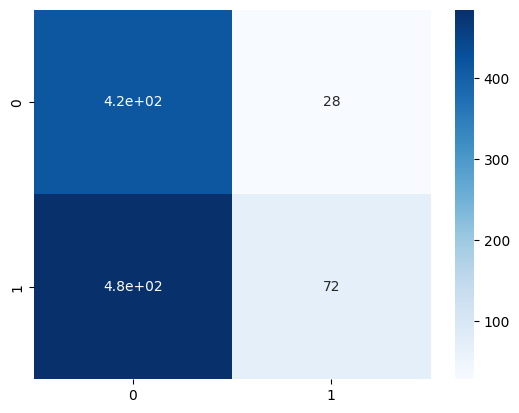

Local Outlier Factor: 512
Accuracy Score :
0.488
Classification Report :
              precision    recall  f1-score   support

           0       0.46      0.94      0.62       444
           1       0.72      0.13      0.22       556

    accuracy                           0.49      1000
   macro avg       0.59      0.53      0.42      1000
weighted avg       0.61      0.49      0.40      1000


Confusion Matrix for Training Data:


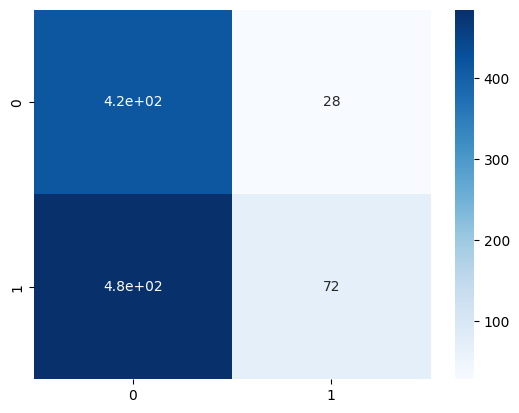

Support Vector Machine: 547
Accuracy Score :
0.453
Classification Report :
              precision    recall  f1-score   support

           0       0.45      0.95      0.61       444
           1       0.59      0.05      0.10       556

    accuracy                           0.45      1000
   macro avg       0.52      0.50      0.35      1000
weighted avg       0.53      0.45      0.32      1000


Confusion Matrix for Training Data:


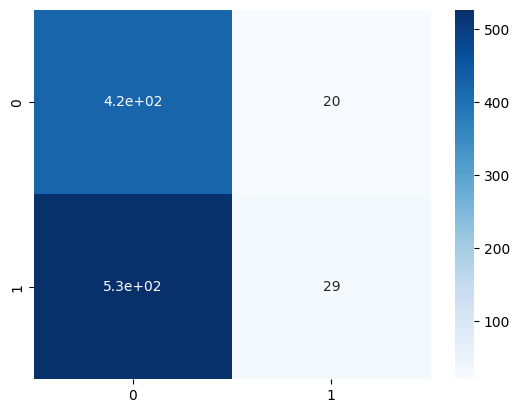

Accuracy Score: 0.83
Classification Report:
              precision    recall  f1-score   support

           0       0.78      0.86      0.82       133
           1       0.88      0.81      0.84       167

    accuracy                           0.83       300
   macro avg       0.83      0.83      0.83       300
weighted avg       0.83      0.83      0.83       300

Confusion Matrix:
[[114  19]
 [ 32 135]]


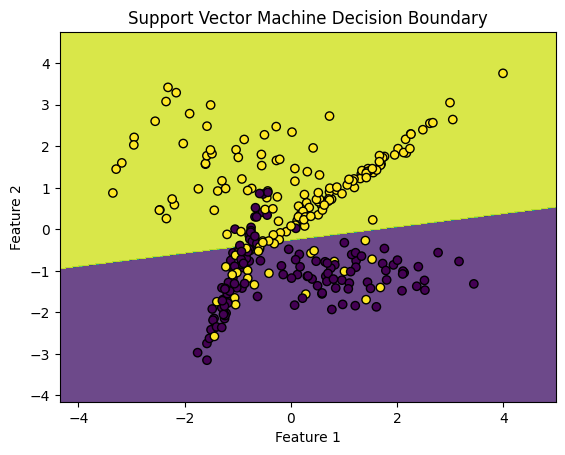

In [57]:
n_outliers = len(outliers)
for i, (clf_name,clf) in enumerate(classifiers.items()):
    #Fit the data and tag outliers
    if clf_name == "Local Outlier Factor":
        y_pred = clf.fit_predict(X)
        scores_prediction = clf.negative_outlier_factor_
    elif clf_name == "Support Vector Machine":
        clf.fit(X)
        y_pred = clf.predict(X)
    else:    
        clf.fit(X)
        scores_prediction = clf.decision_function(X)
        y_pred = clf.predict(X)
    #Reshape the prediction values to 0 for Valid transactions , 1 for Fraud transactions
    y_pred[y_pred == 1] = 0
    y_pred[y_pred == -1] = 1
    n_errors = (y_pred != y).sum()
    # Run Classification Metrics
    print("{}: {}".format(clf_name,n_errors))
    print("Accuracy Score :")
    print(accuracy_score(y,y_pred))
    print("Classification Report :")
    print(classification_report(y,y_pred))
    print("\nConfusion Matrix for Training Data:")
    cm_train = confusion_matrix(y,y_pred)
    sns.heatmap(cm_train, annot=True, cmap=plt.cm.Blues)
    plt.show()
    
    # Split the dataset into training and test sets for SVM
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Train SVM model
svm_model = SVC(kernel='linear', C=1.0)
svm_model.fit(X_train, y_train)

# Predict using the test set
y_pred = svm_model.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)

# Generate classification report
class_report = classification_report(y_test, y_pred)

# Generate confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)

# Print accuracy, classification report, and confusion matrix
print(f'Accuracy Score: {accuracy}')
print('Classification Report:')
print(class_report)
print('Confusion Matrix:')
print(conf_matrix)

# Plot decision boundary
def plot_decision_boundary(model, X, y):
    X = np.array(X)  # Ensure X is a numpy array
    y = np.array(y)  # Ensure y is a numpy array
    # Define the range of the plot
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.01), np.arange(y_min, y_max, 0.01))
    
    # Predict the function value for the whole grid
    Z = model.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    
    # Plot the contour and training examples
    plt.contourf(xx, yy, Z, alpha=0.8)
    plt.scatter(X[:, 0], X[:, 1], c=y, edgecolors='k', marker='o')
    plt.title('Support Vector Machine Decision Boundary')
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.show()

# Plot the decision boundary
plot_decision_boundary(svm_model, X_test, y_test)



## Alternative Approach : Isolation Forest

In [49]:
from sklearn.ensemble import IsolationForest, RandomForestClassifier

from sklearn.metrics import accuracy_score

# Assuming 'data' is already defined and contains your original dataset

# Make a copy of the original data
data_rf = data.copy()
data_rf = data_rf.drop(columns=[  'label2', 'label2_encoded', 'Severity_level'])

# Define numerical columns
numerical_cols = data_rf.select_dtypes(include=[np.number]).columns

# Train the Isolation Forest model
iso_forest = IsolationForest(contamination=0.05, random_state=42)
data_rf['anomaly'] = iso_forest.fit_predict(data_rf[numerical_cols])

# -1 indicates an anomaly, 1 indicates a normal point
data_rf['anomaly'] = data_rf['anomaly'].map({1: False, -1: True})

# Print the number of outliers
outlier_count = data_rf['anomaly'].sum()
print(f'Number of outliers: {outlier_count}')

# Filter the dataset to exclude rows with outliers
filtered_data = data_rf[data_rf['anomaly'] == False]

# Assuming 'label' is the target variable you want to predict, re-add it for modeling
filtered_data['Outlier'] = data.loc[filtered_data.index, 'Outlier']

# Split the dataset into training and testing sets
X = filtered_data.drop(columns=['anomaly', 'Outlier'])
y = filtered_data['Outlier']

# Ensure X contains only numerical columns
X = X.select_dtypes(include=[np.number])

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Choose a classifier (Random Forest in this case)
clf = RandomForestClassifier()

# Train the classifier
clf.fit(X_train, y_train)

# Make predictions
y_pred = clf.predict(X_test)

# Calculate the accuracy
accuracy = accuracy_score(y_test, y_pred)

# Display the first few rows of the filtered dataset
filtered_data.head()

Number of outliers: 1207


,timestamp,X,Y,Speed,Heading,Density,Acc,time_seconds,Outlier,outlier_encoded,anomaly
0,1900-01-01 00:05:36,1.520675,-0.723185,1.432952,-0.248261,-1.014795,-0.211707,-1.588050,False,0,False
1,1900-01-01 00:05:37,0.749318,-0.395174,1.448705,-0.149296,-1.002863,-0.211707,-1.587063,False,0,False
2,1900-01-01 00:05:38,1.186075,-0.130874,1.445125,-0.171591,-0.984965,-0.285589,-1.586077,False,0,False
3,1900-01-01 00:05:39,0.872202,0.040846,1.464815,-0.229505,-0.973032,-0.156295,-1.585091,False,0,False
4,1900-01-01 00:05:40,1.233452,0.392500,1.456939,-0.221219,-0.973032,-0.165530,-1.584104,False,0,False


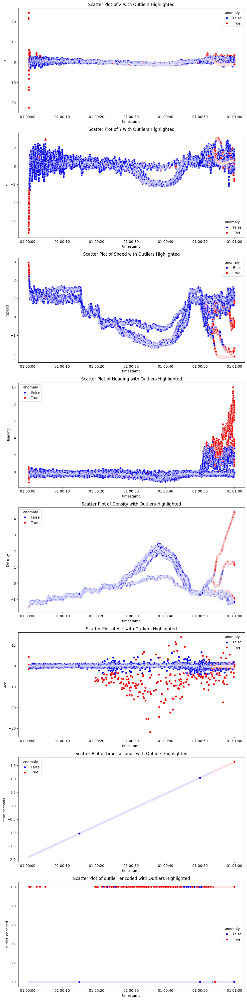

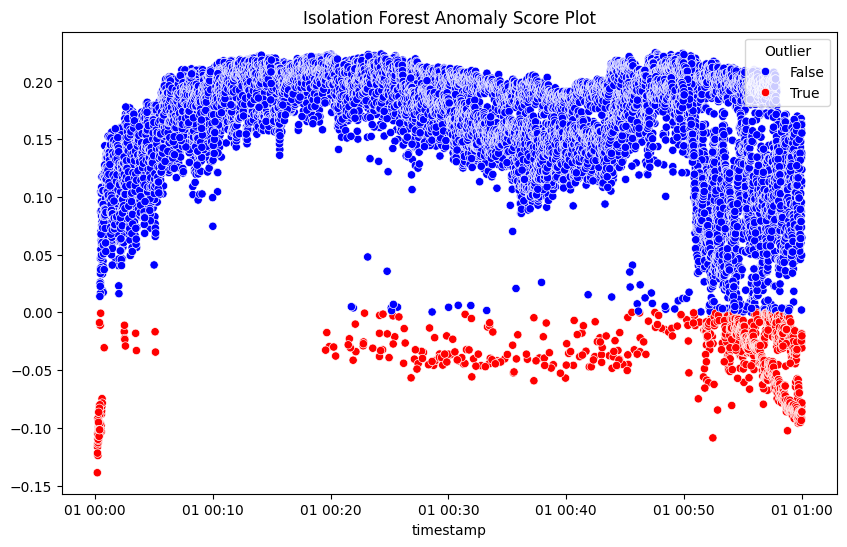

In [50]:
# Plotting
fig, axes = plt.subplots(len(numerical_cols), 1, figsize=(10, 5 * len(numerical_cols)))

for i, col in enumerate(numerical_cols):
    sns.scatterplot(
        x='timestamp', y=col, 
        data=data_rf, 
        hue='anomaly', 
        palette={False: 'blue', True: 'red'}, 
        ax=axes[i]
    )
    axes[i].set_title(f'Scatter Plot of {col} with Outliers Highlighted')

plt.tight_layout()
plt.show()

#  Plot anomaly scores for each point
anomaly_scores = iso_forest.decision_function(data_rf[numerical_cols])

plt.figure(figsize=(10, 6))
sns.scatterplot(x=data_rf['timestamp'], y=anomaly_scores, hue=data_rf['anomaly'], palette={False: 'blue', True: 'red'})
plt.title('Isolation Forest Anomaly Score Plot')
plt.legend(title='Outlier', loc='upper right')
plt.show()


## Alternative Approach : Local Outlier Factor (LOF)

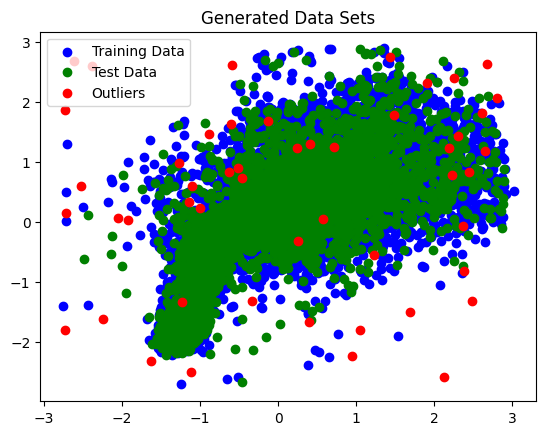

Accuracy with Training Data:  0.9034972881989901
Accuracy with Test Data:  0.9021090909090909
Accuracy in Outlier Detection:  1.0
Total Outliers in Training Data:  1604
Total Outliers in Testing Data:  701
Overall Accuracy:  0.9030808168964916


In [51]:
from sklearn.neighbors import LocalOutlierFactor

# Calculate the min and max for each feature in the dataset to define the range for outliers
min_train = X_train.min(axis=0).values
max_train = X_train.max(axis=0).values

# Generate outliers using a uniform distribution within the range of the training data
rng = np.random.RandomState(42)
X_outlier = rng.uniform(low=min_train, high=max_train, size=(50, X_train.shape[1]))

# Visualizing the generated data sets: Training - blue, Test - green, Outliers - red
plt.title("Generated Data Sets")
plt.scatter(X_train.iloc[:, 0], X_train.iloc[:, 1], c='blue', label='Training Data')
plt.scatter(X_test.iloc[:, 0], X_test.iloc[:, 1], c='green', label='Test Data')
plt.scatter(X_outlier[:, 0], X_outlier[:, 1], c='red', label='Outliers')
plt.legend()
plt.show()

# Fitting the Local Outlier Factor (LOF) model with the training data
lof = LocalOutlierFactor(n_neighbors=20, contamination=0.1)
y_train_pred = lof.fit_predict(X_train)

# Convert predictions to binary outcomes: 1 for inliers, -1 for outliers
pred_train_binary = np.where(y_train_pred == 1, 0, 1)

# Calculate the confusion matrix and accuracy for training data
cm_train = confusion_matrix(y_train, pred_train_binary)
accuracy_train = accuracy_score(y_train, pred_train_binary)

# Fitting the LOF model with novelty=True to predict on test and outlier data
lof_novelty = LocalOutlierFactor(n_neighbors=20, contamination=0.1, novelty=True)
lof_novelty.fit(X_train)

# Predicting on the test data and generated outliers
y_test_pred = lof_novelty.predict(X_test)
y_outlier_pred = lof_novelty.predict(X_outlier)

# Convert predictions to binary outcomes: 1 for inliers, -1 for outliers
pred_test_binary = np.where(y_test_pred == 1, 0, 1)
pred_outlier_binary = np.where(y_outlier_pred == 1, 0, 1)

# Calculate the confusion matrix and accuracy for testing data
cm_test = confusion_matrix(y_test, pred_test_binary)
accuracy_test = accuracy_score(y_test, pred_test_binary)

# Calculate outlier detection accuracy
outlier_detection_accuracy = (pred_outlier_binary == 1).sum() / len(pred_outlier_binary)

# Count the number of outliers detected in the training and testing data
total_outliers_train = (pred_train_binary == 1).sum()
total_outliers_test = (pred_test_binary == 1).sum()

# Calculate overall accuracy
y_combined = np.concatenate([y_train, y_test])
pred_combined = np.concatenate([pred_train_binary, pred_test_binary])
overall_accuracy = accuracy_score(y_combined, pred_combined)

# Print accuracy results and total outliers detected
print("Accuracy with Training Data: ", accuracy_train)
print("Accuracy with Test Data: ", accuracy_test)
print("Accuracy in Outlier Detection: ", outlier_detection_accuracy)
print("Total Outliers in Training Data: ", total_outliers_train)
print("Total Outliers in Testing Data: ", total_outliers_test)
print("Overall Accuracy: ", overall_accuracy)




Classification Report for Training Data:
              precision    recall  f1-score   support

       False       1.00      0.90      0.95     15985
        True       0.03      1.00      0.07        56

    accuracy                           0.90     16041
   macro avg       0.52      0.95      0.51     16041
weighted avg       1.00      0.90      0.95     16041


Confusion Matrix for Training Data:


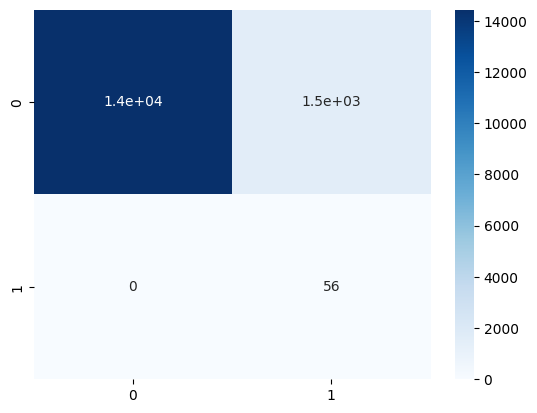


Classification Report for Testing Data:
              precision    recall  f1-score   support

       False       1.00      0.90      0.95      6847
        True       0.04      1.00      0.08        28

    accuracy                           0.90      6875
   macro avg       0.52      0.95      0.51      6875
weighted avg       1.00      0.90      0.94      6875


Confusion Matrix for Testing Data:


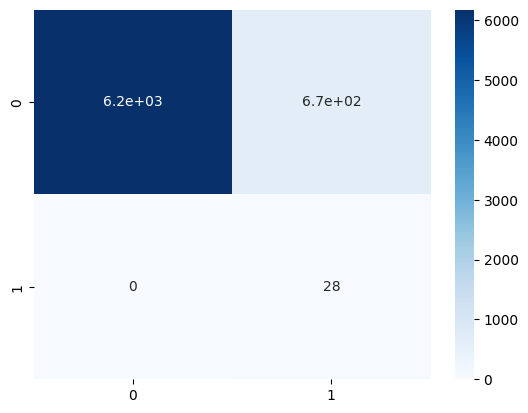

In [52]:
# Print the classification report and confusion matrix for the training data
print("\nClassification Report for Training Data:")
print(classification_report(y_train, pred_train_binary))

print("\nConfusion Matrix for Training Data:")
sns.heatmap(cm_train, annot=True, cmap=plt.cm.Blues)
plt.show()

# Print the classification report and confusion matrix for the testing data
print("\nClassification Report for Testing Data:")
print(classification_report(y_test, pred_test_binary))

print("\nConfusion Matrix for Testing Data:")
sns.heatmap(cm_test, annot=True, cmap=plt.cm.Blues)
plt.show()

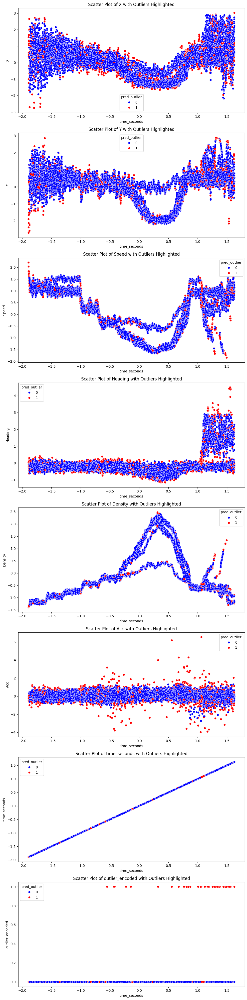

In [53]:
# Add outlier predictions to the original data for plotting
X_train['pred_outlier'] = pred_train_binary
X_test['pred_outlier'] = pred_test_binary

# Plot scatter plots for each numerical column with the outliers highlighted
fig, axes = plt.subplots(len(numerical_cols), 1, figsize=(10, 5 * len(numerical_cols)))

for i, col in enumerate(numerical_cols):
    sns.scatterplot(
        x='time_seconds', y=col, 
        data=X_train, 
        hue='pred_outlier', 
        palette={0: 'blue', 1: 'red'}, 
        ax=axes[i]
    )
    axes[i].set_title(f'Scatter Plot of {col} with Outliers Highlighted')

plt.tight_layout()
plt.show()



In [54]:
X.head()

,X,Y,Speed,Heading,Density,Acc,time_seconds,outlier_encoded
0,1.520675,-0.723185,1.432952,-0.248261,-1.014795,-0.211707,-1.588050,0
1,0.749318,-0.395174,1.448705,-0.149296,-1.002863,-0.211707,-1.587063,0
2,1.186075,-0.130874,1.445125,-0.171591,-0.984965,-0.285589,-1.586077,0
3,0.872202,0.040846,1.464815,-0.229505,-0.973032,-0.156295,-1.585091,0
4,1.233452,0.392500,1.456939,-0.221219,-0.973032,-0.165530,-1.584104,0


# DBSCAN

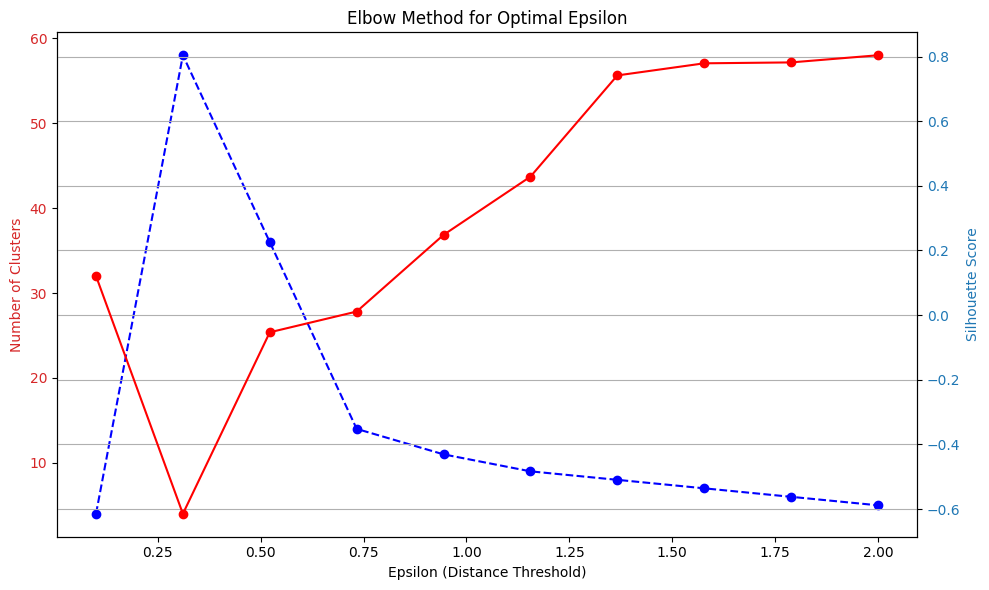

Number of clusters: 47
Number of noise points: 2072


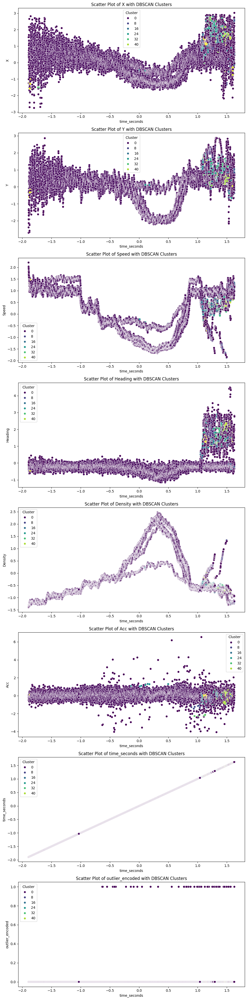

Number of outliers (DBSCAN): 2072
Silhouette Score: -0.1803527468274244


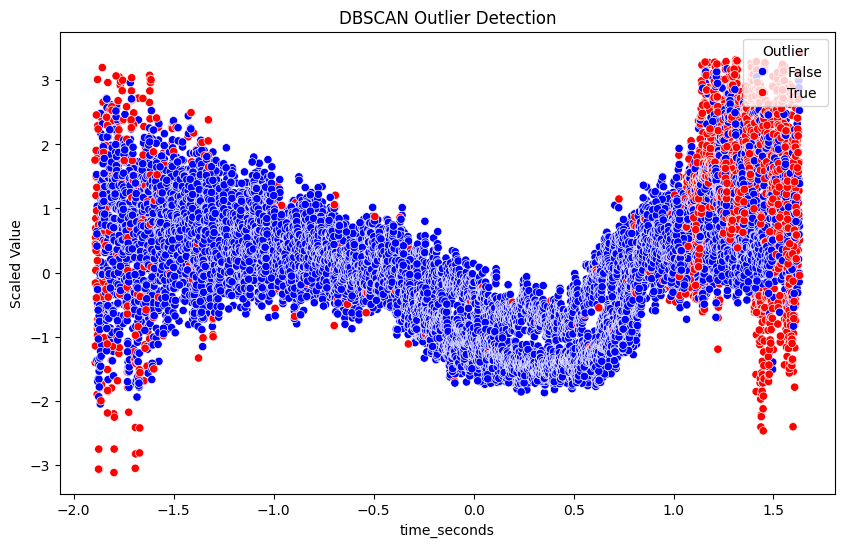

In [55]:
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
from sklearn.metrics import silhouette_score

# Assuming X is your dataset and numerical_cols are the numerical columns to consider
# Standardize the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X[numerical_cols])

# Elbow method to determine epsilon (distance threshold)
def plot_elbow_curve(data, min_eps, max_eps):
    eps_range = np.linspace(min_eps, max_eps, 10)
    num_clusters = []
    silhouette_scores = []
    for eps in eps_range:
        dbscan = DBSCAN(eps=eps, min_samples=5)
        clusters = dbscan.fit_predict(data)
        
        # Number of clusters (excluding noise)
        n_clusters = len(set(clusters)) - (1 if -1 in clusters else 0)
        num_clusters.append(n_clusters)
        
        # Silhouette score (higher is better, 1 is best)
        if n_clusters > 1:
            silhouette_scores.append(silhouette_score(data, clusters))
        else:
            silhouette_scores.append(-1)  # Handle case where there is only one cluster
        
    # Plotting
    fig, ax1 = plt.subplots(figsize=(10, 6))

    color = 'tab:red'
    ax1.set_xlabel('Epsilon (Distance Threshold)')
    ax1.set_ylabel('Number of Clusters', color=color)
    ax1.plot(eps_range, num_clusters, marker='o', linestyle='--', color='b')
    ax1.tick_params(axis='y', labelcolor=color)

    ax2 = ax1.twinx()  
    color = 'tab:blue'
    ax2.set_ylabel('Silhouette Score', color=color)  
    ax2.plot(eps_range, silhouette_scores, marker='o', linestyle='-', color='r')
    ax2.tick_params(axis='y', labelcolor=color)

    plt.title('Elbow Method for Optimal Epsilon')
    fig.tight_layout()  
    plt.grid(True)
    plt.show()

# Plot the elbow curve
plot_elbow_curve(X_scaled, 0.1, 2.0)

# Apply DBSCAN with chosen epsilon
epsilon = 0.5  # Adjust epsilon based on elbow method or prior knowledge
min_samples = 5  # Adjust minimum samples as needed
dbscan = DBSCAN(eps=epsilon, min_samples=min_samples)
clusters = dbscan.fit_predict(X_scaled)

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(clusters)) - (1 if -1 in clusters else 0)
n_noise_ = list(clusters).count(-1)

# Add cluster information to the DataFrame
data_DBSCAN = X.copy()
data_DBSCAN['Cluster'] = clusters

# Print the number of clusters and noise points
print(f'Number of clusters: {n_clusters_}')
print(f'Number of noise points: {n_noise_}')

# Plotting
fig, axes = plt.subplots(len(numerical_cols), 1, figsize=(10, 5 * len(numerical_cols)))

for i, col in enumerate(numerical_cols):
    sns.scatterplot(
        x='time_seconds', y=col,
        data=data_DBSCAN,
        hue='Cluster',
        palette='viridis',
        ax=axes[i]
    )
    axes[i].set_title(f'Scatter Plot of {col} with DBSCAN Clusters')

plt.tight_layout()
plt.show()

# Outlier detection using DBSCAN
outliers_DBSCAN = data_DBSCAN['Cluster'] == -1

# Print the number of outliers
outlier_count_DBSCAN = outliers_DBSCAN.sum()
print(f'Number of outliers (DBSCAN): {outlier_count_DBSCAN}')

# Evaluation metrics (Silhouette score)
silhouette = silhouette_score(X_scaled, clusters)
print(f'Silhouette Score: {silhouette}')

# Plot outliers
plt.figure(figsize=(10, 6))
sns.scatterplot(x=data_DBSCAN['time_seconds'], y=X_scaled[:, 0], hue=outliers_DBSCAN, palette={False: 'blue', True: 'red'})
plt.title('DBSCAN Outlier Detection')
plt.xlabel('time_seconds')
plt.ylabel('Scaled Value')
plt.legend(title='Outlier', loc='upper right')
plt.show()
